In [1]:
import torch
print(torch.cuda.is_available())
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import seaborn as sns
import scanpy as sc
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(4,4)
from scanpy import AnnData

False


In [2]:
adata=sc.read_h5ad('visium_mouse_raw.h5ad')
adata

AnnData object with n_obs × n_vars = 2678 × 20387
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [3]:
adata2=sc.read_h5ad('visium_mouse4_raw.h5ad')
adata2

AnnData object with n_obs × n_vars = 2140 × 19050
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000) 
sc.pp.highly_variable_genes(adata2, n_top_genes=2000) 

In [14]:
adata = adata[:, adata.var['highly_variable']]
adata2 = adata2[:, adata2.var['highly_variable']]

In [15]:
cdata=adata.concatenate(adata2)

In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.scale(adata, max_value=10)

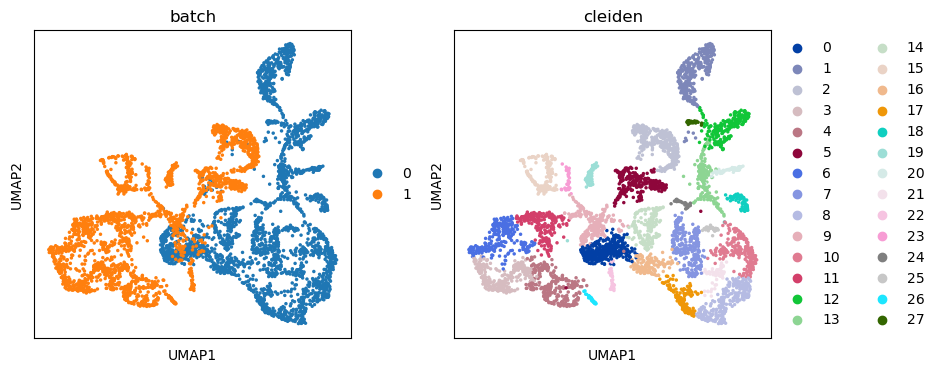

In [16]:
sc.tl.pca(adata)
sc.pp.neighbors(cdata)
sc.tl.leiden(cdata,key_added='cleiden')
sc.tl.umap(cdata)
sc.pl.umap(cdata,color=['batch','cleiden'])

2025-03-10 20:49:51,272 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-10 20:49:53,901 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-10 20:49:54,050 - harmonypy - INFO - Iteration 1 of 20
2025-03-10 20:49:58,251 - harmonypy - INFO - Iteration 2 of 20
2025-03-10 20:50:02,282 - harmonypy - INFO - Iteration 3 of 20
2025-03-10 20:50:06,230 - harmonypy - INFO - Iteration 4 of 20
2025-03-10 20:50:09,910 - harmonypy - INFO - Iteration 5 of 20
2025-03-10 20:50:13,925 - harmonypy - INFO - Iteration 6 of 20
2025-03-10 20:50:18,027 - harmonypy - INFO - Iteration 7 of 20
2025-03-10 20:50:21,957 - harmonypy - INFO - Iteration 8 of 20
2025-03-10 20:50:24,037 - harmonypy - INFO - Iteration 9 of 20
2025-03-10 20:50:25,686 - harmonypy - INFO - Converged after 9 iterations


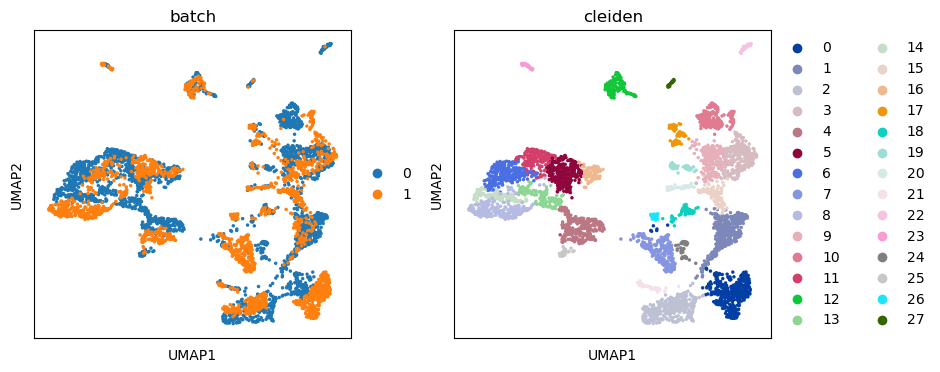

In [17]:
sc.external.pp.harmony_integrate(cdata, 'batch',max_iter_harmony=20)
sc.pp.neighbors(cdata,n_pcs=20,n_neighbors=20,use_rep='X_pca_harmony')
sc.tl.leiden(cdata,key_added='cleiden')
sc.tl.umap(cdata)
sc.pl.umap(cdata,color=['batch','cleiden'])

In [7]:
sc.tl.rank_genes_groups(cdata,groupby='cleiden')

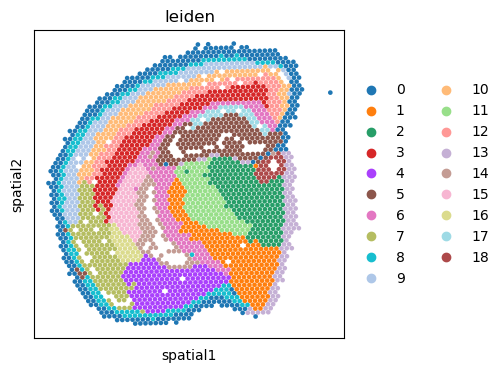

In [9]:
sc.pl.embedding(adata,basis='spatial',color='leiden')

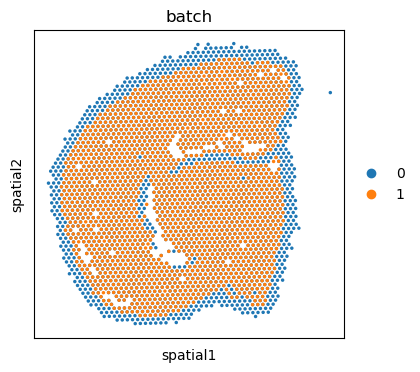

In [11]:
sc.pl.embedding(cdata,basis='spatial',color='batch')

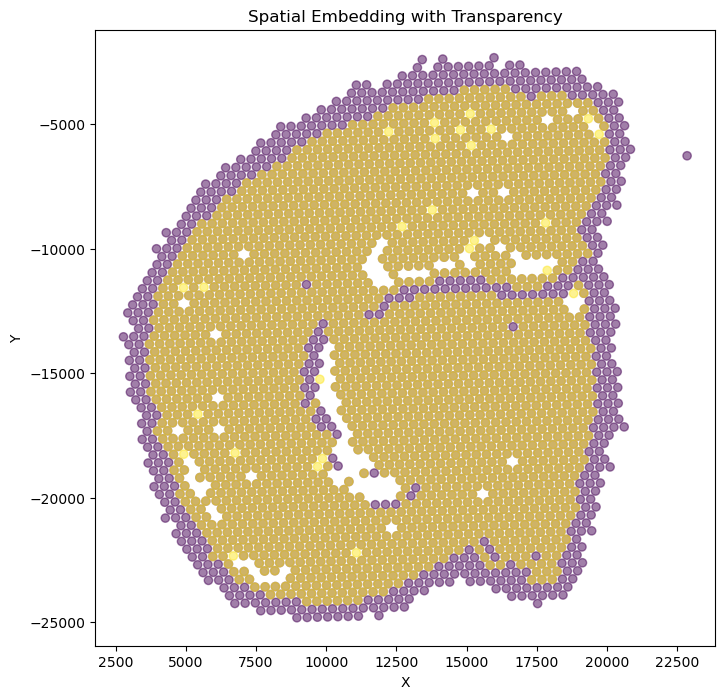

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt

# Extract spatial coordinates
coords = cdata.obsm["X_spatial"]
batches = cdata.obs["batch"]

# Create scatter plot with transparency
plt.figure(figsize=(8, 8))
plt.scatter(coords[:, 0], coords[:, 1], c=batches.cat.codes, cmap="viridis", alpha=0.5)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Spatial Embedding with Transparency")
plt.show()


['Cabp7' 'Fth1' 'Slc1a2' 'Mt1']


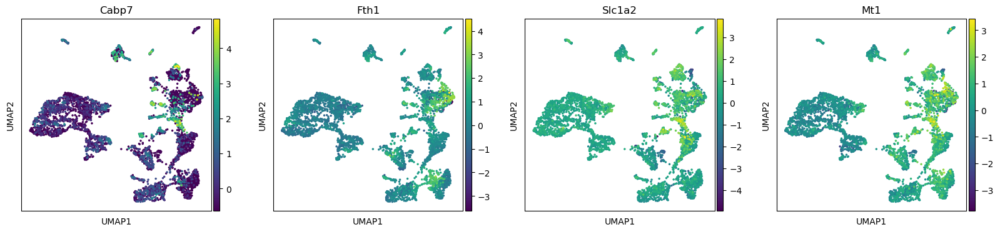

['Nrgn' 'Arpp21' 'Sept5' 'Lingo1']


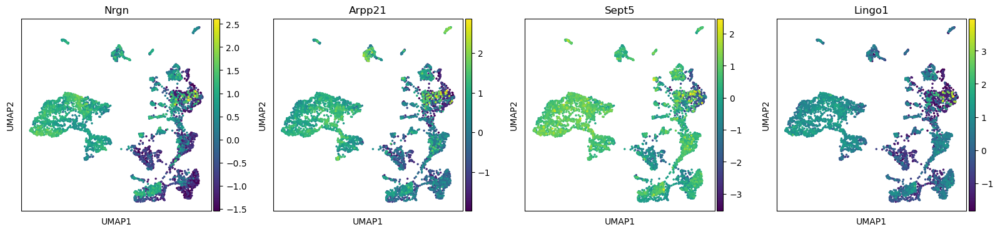

['Shank3' 'Ndrg2' 'Prkcd' 'Ildr2']


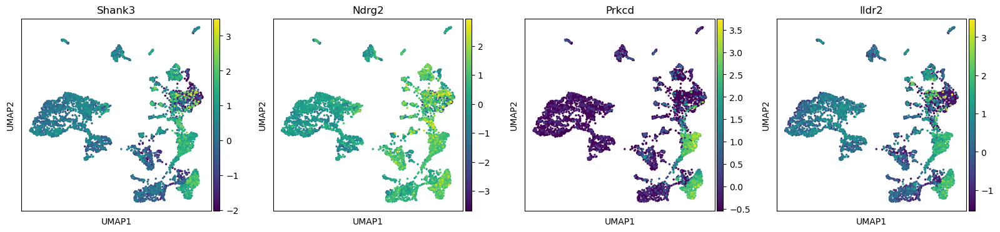

['Ptgds' 'Gfap' 'Apod' 'Atp1a2']


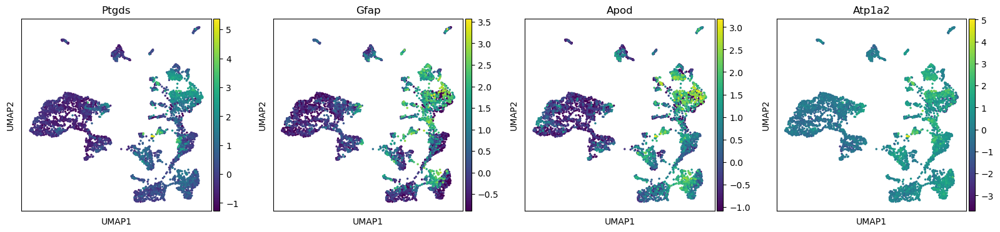

['Ppp1r1b' 'Penk' 'Gpr88' 'Mbp']


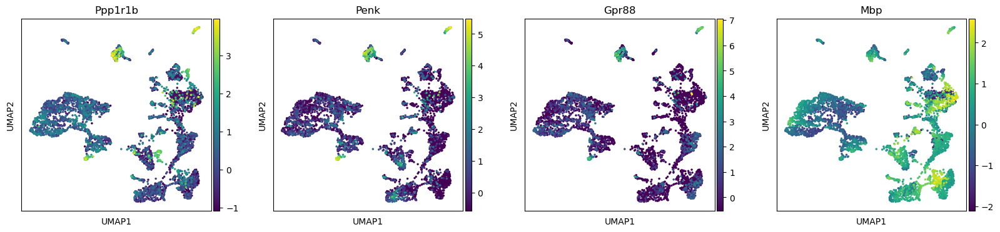

['Slc17a7' 'Snap25' 'Nrgn' '1110008P14Rik']


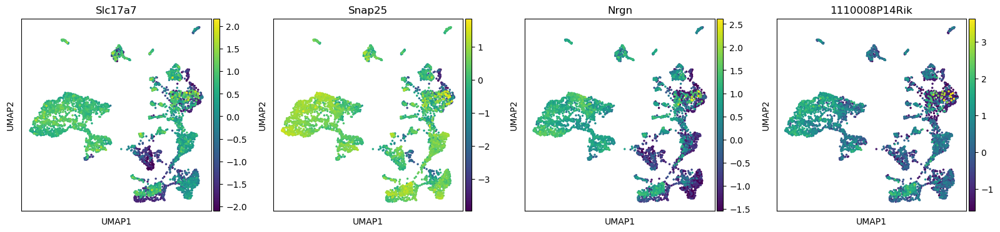

['Vxn' 'Slc17a7' 'Hpcal4' 'Ncald']


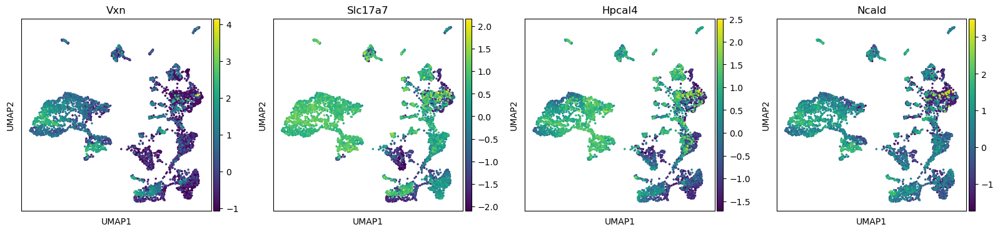

['Ptgds' 'Ppp1r14a' 'Opalin' 'Apod']


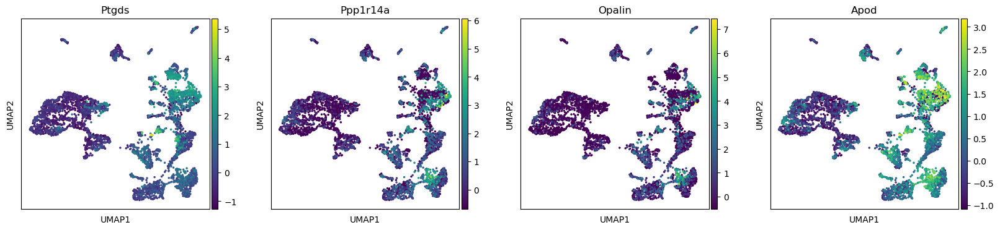

['Kndc1' 'Mbp' 'Plekhg1' 'Stmn4']


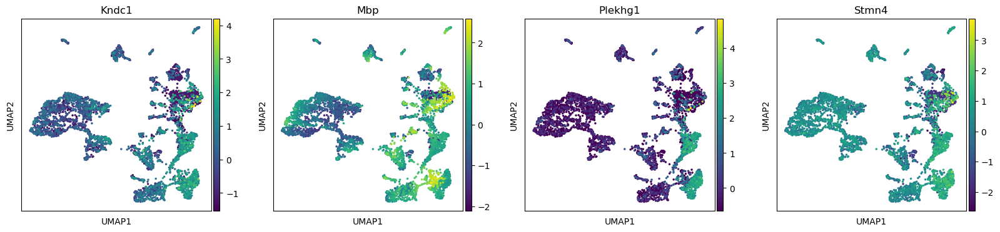

['Mt1' 'Cst3' 'Nsmf' 'Gfap']


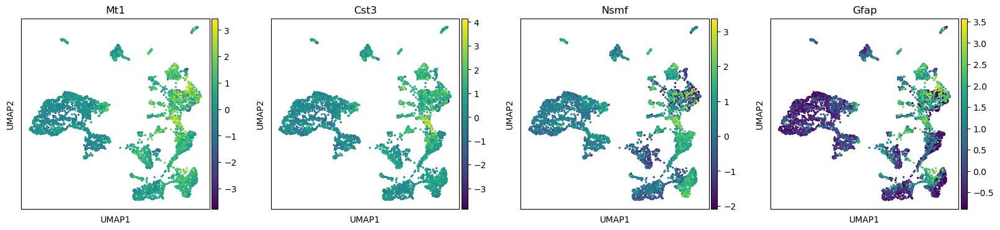

['Stmn3' 'Eno2' 'Sncb' 'Stxbp1']


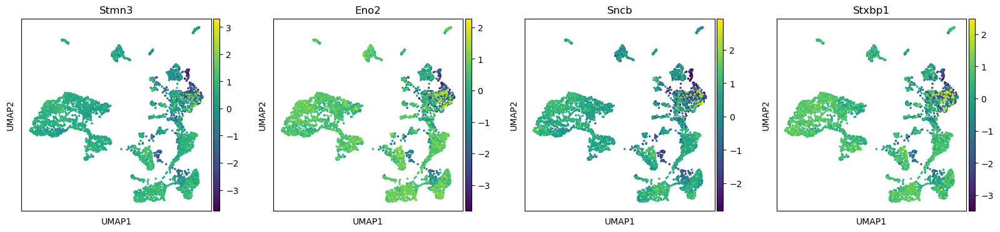

['Hpcal4' 'Slc17a7' 'Ctxn1' 'Rtn1']


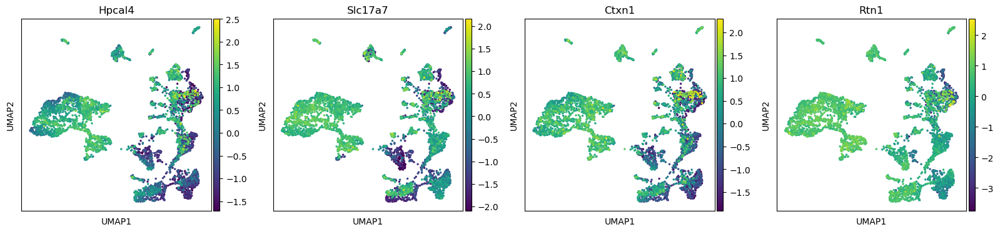

['Apoe' 'Clu' 'Atp1a2' 'Gfap']


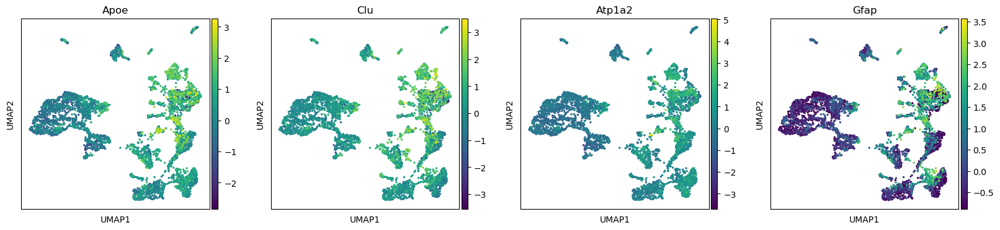

['Nptxr' 'Ctxn1' 'Olfm1' 'Hpcal4']


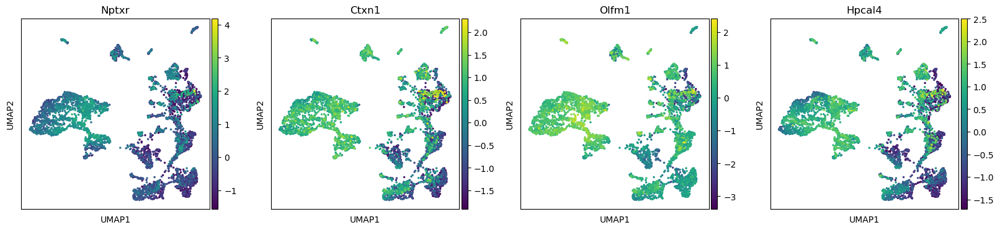

['Caln1' 'Baiap2' 'Camkv' 'Bex2']


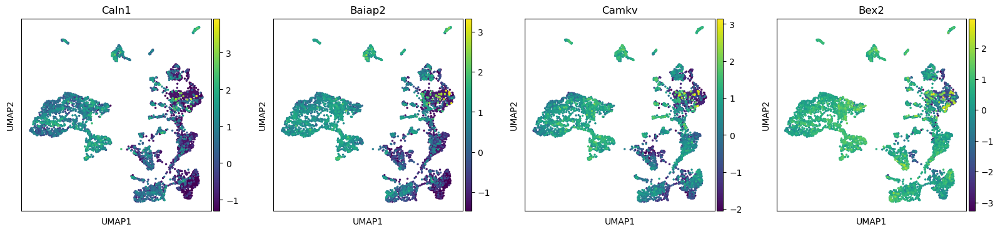

['Prox1' 'Kbtbd11' 'Mt2' 'Slc1a2']


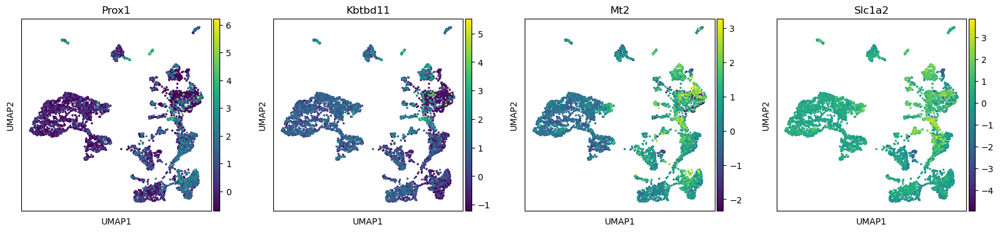

['Olfm1' 'Ddn' 'Psd' 'Rph3a']


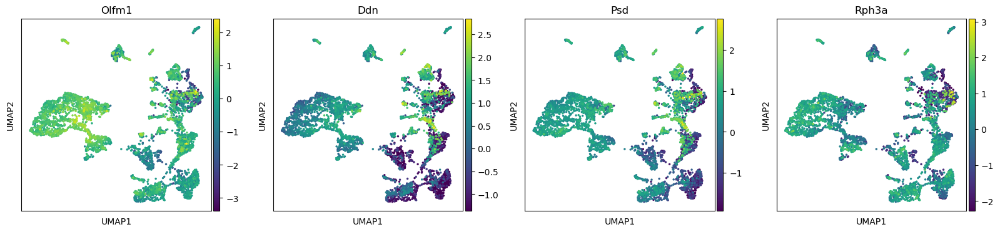

['Slc17a7' 'Snca' 'Ctxn1' 'Nptxr']


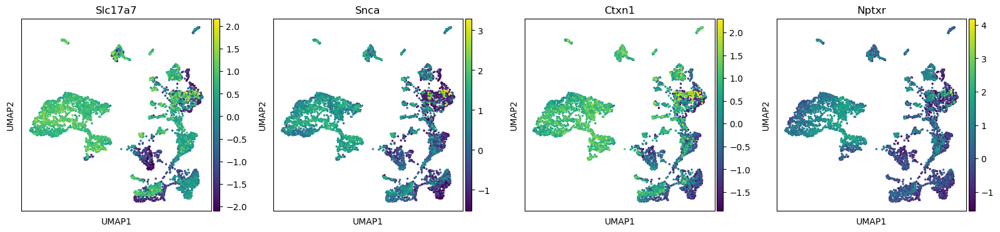

['Gria1' 'Tmsb4x' 'Wfs1' 'Doc2b']


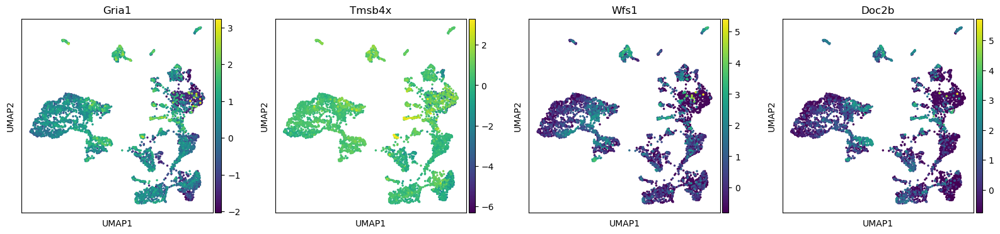

['Hpcal4' 'Cplx2' 'Ddn' 'Slc17a7']


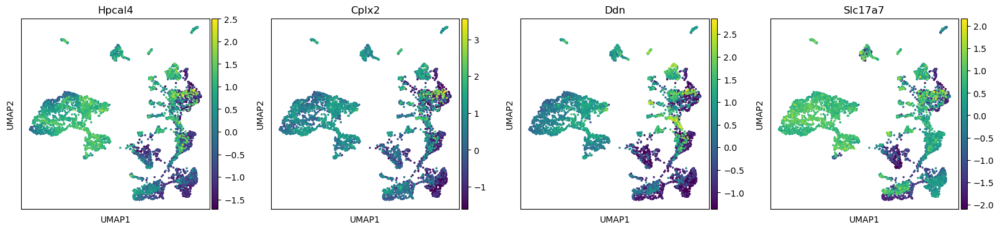

['Ppp3ca' 'Hpca' 'Camkv' 'Baiap2']


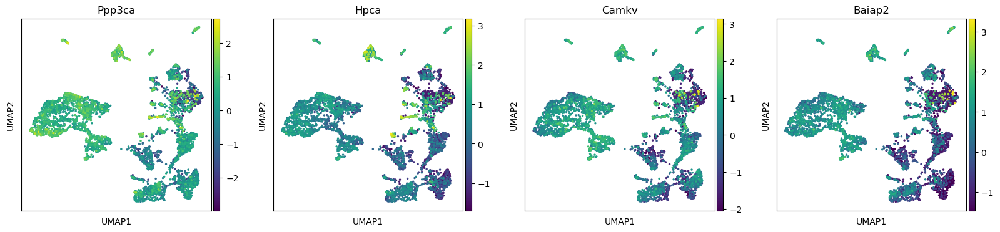

['Sparc' 'Gnas' 'Agt' 'Nap1l5']


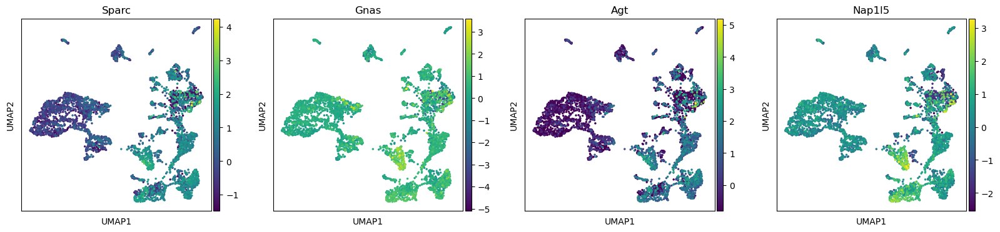

['Apod' 'Igfbp5' 'Tpt1' 'Gfap']


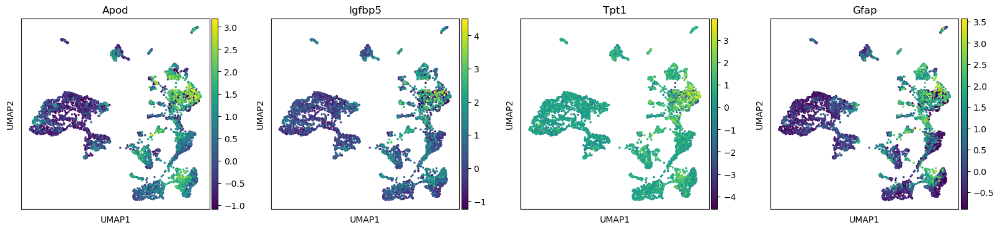

['Mbp' 'Plp1' 'Mobp' 'Cnp']


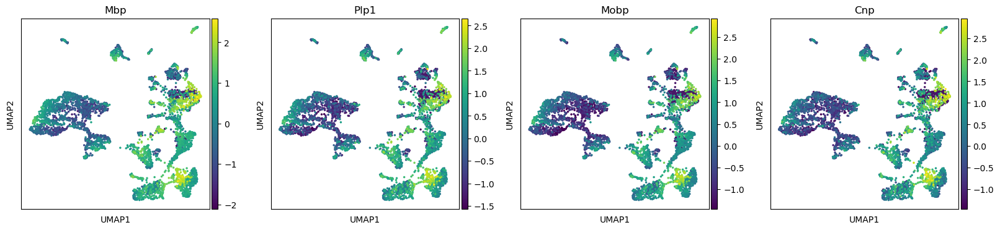

['Nnat' 'Cst3' 'Apoe' 'Clu']


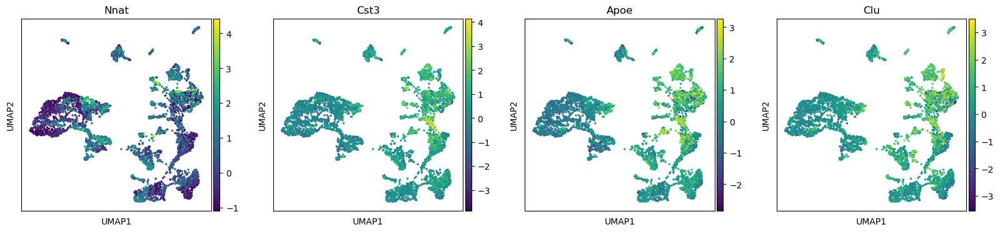

['Camk2n1' 'Nrgn' 'Mef2c' 'Atp1a1']


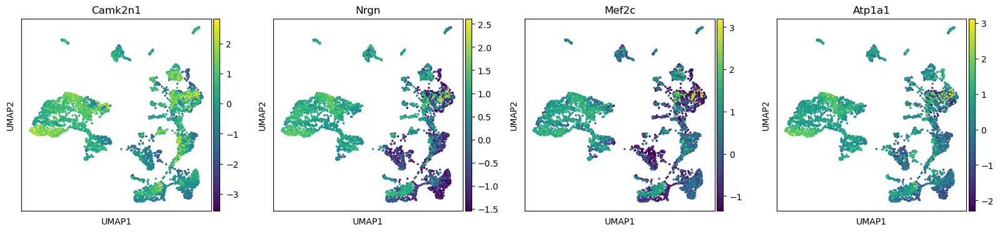

['Ttr' 'Enpp2' 'Clic6' 'Igfbp2']


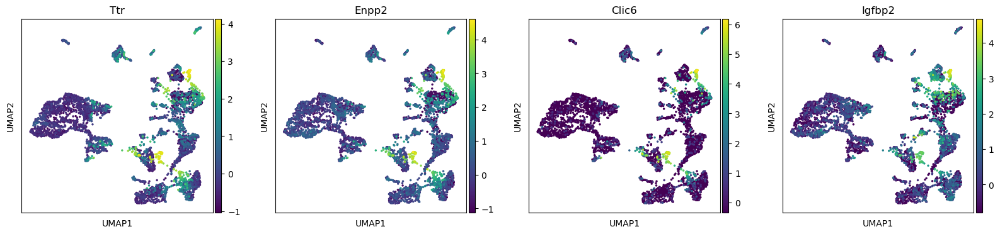

['Hpca' 'Cabp7' 'Neurod6' 'Ptk2b']


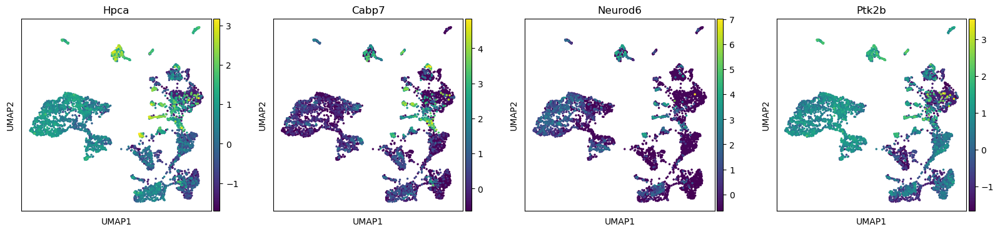

In [8]:
for l in cdata.obs['cleiden'].unique():
    genes=cdata.uns['rank_genes_groups']['names'][l][:4]
    print(genes)
    sc.pl.umap(cdata,color=genes)

In [ ]:
sc.pl.umap(adata,color=['Tle4','Aqp4','Olig2','Cux2','Rorb','Sema5a'])

In [ ]:
class CrossAE(nn.Module):
    def __init__(self, input_dim_left,latent_dim):
        super(MCGAE, self).__init__()
        #data left encoding to latent
        self.encoder1_left = nn.Linear(input_dim_left, latent_dim)  # Encoder layer
        self.batch_norm1_left = nn.BatchNorm1d(latent_dim)  # Batch normalization for encoder
        self.dropout_left = nn.Dropout(0.2)
        #data right encoding to latent
        self.encoder1_right = nn.Linear(input_dim_right, latent_dim)  # Encoder layer
        self.batch_norm1_right = nn.BatchNorm1d(latent_dim)  # Batch normalization for encoder
        self.dropout_right = nn.Dropout(0.2)
        
        #decode latent to left
        self.decoder1_left = nn.Linear(latent_dim, input_dim_left)  # Decoder layer
        self.batch_norm2_left = nn.BatchNorm1d(input_dim_left)  # Batch normalization for decoder
        #decode latent to right
        self.decoder1_right=nn.Linear(latent_dim, input_dim_right)
        self.batch_norm2_right=nn.BatchNorm1d(input_dim_right)

    def encode_left(self, x):
        # Apply ReLU activation after batch normalization and dropout
        x = torch.relu(self.batch_norm1_left(self.encoder1_left(x)))  # Apply BatchNorm after the linear layer
        x = self.dropout_left(x)
        return x
    def encode_right(self, x):
        # Apply ReLU activation after batch normalization and dropout
        x = torch.relu(self.batch_norm1_right(self.encoder1_right(x)))  # Apply BatchNorm after the linear layer
        x = self.dropout_right(x)
        return x
    def decode_left(self, z):
        # Decode the latent representation back to input space
        z = self.batch_norm2_left(self.decoder1_left(z))  # Apply BatchNorm after the linear layer
        return z
    def decode_right(self, z):
        # Decode the latent representation back to input space
        z = self.batch_norm2_right(self.decoder1_right(z))  # Apply BatchNorm after the linear layer
        return z

    def forward_left_to_both(self, x):
        # Encode the input
        z = self.encode_left(x)
        # Decode the latent representation
        recon_left = self.decode_left(z)
        recon_right=self.decode_right(z)
        return recon_left, recon_right
    def forward_right_to_both(self, x):
        # Encode the input
        z = self.encode_right(x)
        # Decode the latent representation
        recon_left = self.decode_left(z)
        recon_right=self.decode_right(z)
        return recon_left, recon_right
#     def forward

    def predict_from_left(self, x):
        # Use the model for inference without computing gradients
        with torch.no_grad():
            z=torch.relu(self.batch_norm1_left(self.encoder1_left(x)))
            recon_left = self.decode_left(z)
            recon_right=self.decode_right(z)
            return recon_left, recon_right

    def predict_from_right(self, x):
        # Use the model for inference without computing gradients
        with torch.no_grad():
            z=torch.relu(self.batch_norm1_right(self.encoder1_right(x)))
            recon_left = self.decode_left(z)
            recon_right=self.decode_right(z)
            return recon_left, recon_right

    
    def sample_latent_from_left(self, x):
        # Use the model for inference without computing gradients
        with torch.no_grad():
            z=torch.relu(self.batch_norm1_left(self.encoder1_left(x)))
            return z

    def sample_latent_from_right(self, x):
        # Use the model for inference without computing gradients
        with torch.no_grad():
            z=torch.relu(self.batch_norm1_right(self.encoder1_right(x)))
            return z


def compute_loss(true, pred):
    """
    Compute the loss between true and predicted values.
    MSE (Mean Squared Error) is used here.
    """
    loss = torch.mean((true - pred)**2)
    return loss

def train_step(model, data_left,data_right, optimizer):
    """
    Perform one training step for the model.
    """
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear previous gradients
    #get loss for left to right embeddings
    recon_left_ltr, recon_right_ltr = model.forward_left_to_both(data_left)  # Forward pass
    loss_left_ltr = compute_loss(data_left, recon_left_ltr)  # Compute the loss
    loss_right_ltr = compute_loss(data_right, recon_right_ltr)  # Compute the loss
    #get loss for right to left embeddings 
    recon_left_rtl, recon_right_rtl = model.forward_right_to_both(data_right)  # Forward pass
    loss_left_rtl = compute_loss(data_left, recon_left_rtl)  # Compute the loss
    loss_right_rtl = compute_loss(data_right, recon_right_rtl)  # Compute the loss
    loss=loss_left_ltr+loss_right_ltr+loss_left_rtl+loss_right_rtl
    loss.backward()  # Backpropagation
    optimizer.step()  # Update the weights
    return loss.item()